# Centroïd and organoïd finder used by OAT

# 1- Centroid finder

In [42]:
import pandas as pd
import numpy as np
from skimage import io
import random
import time

data = r"./data/distant_clusters.csv"
df = pd.read_csv(data, index_col = 0)

print(df.head())

           x           y           z   tp  track  objID  target  metaObjID
0  50.000000  170.000000  100.000000  0.0    0.0    0.0     NaN        0.0
1  47.914432  169.798995  101.910551  0.0    1.0    0.0     NaN        0.0
2  50.348814  169.597990   96.025441  0.0    2.0    0.0     NaN        0.0
3  52.965600  169.396985  103.868100  0.0    3.0    0.0     NaN        0.0
4  44.472050  169.195980   99.022183  0.0    4.0    0.0     NaN        0.0


## Vizualizing the dataset

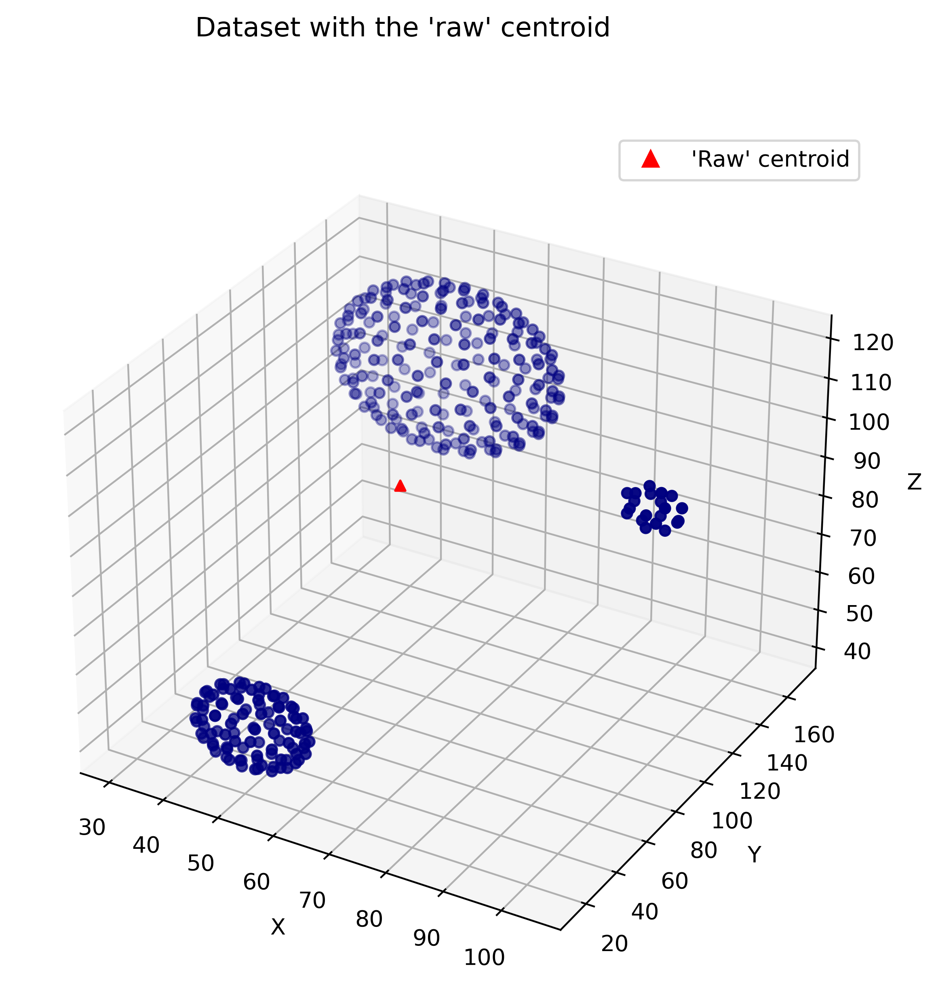

In [7]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

fig = plt.figure( figsize=(20,7), dpi = 400 )

ax = fig.add_subplot( 111, projection='3d' ); ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z');

## Plotting all data
ax.scatter(df["x"], df["y"], df["z"], color = "navy")

## Plotting the "raw" centroid
raw_cent_coord = np.array(df[list("xyz")].mean())

ax.scatter(raw_cent_coord[0], raw_cent_coord[1], raw_cent_coord[2], color = "red", marker = "^")
legend = [Line2D([0], [0], marker = "^", color = "red", label = "'Raw' centroid", markersize = 7, ls = '')]

plt.legend(handles = legend, loc = 'best')
fig.suptitle("Dataset with the 'raw' centroid")

plt.show()

# Using gradients slope
The goal is to find the centroid of the organoïd. But as seen on the figure above, segmenting the organoïd only can be difficult and lead to some noise in the form of small cell blobs or parts of another organoïd.

In this part, we will use the gradient slope to lean towards the sum minima.

## Function to compute the sum of the distance between all the points and a given point

In [3]:
def compute_distance_sum(df, point):
    
    
    distance_list = []
    for ID in df.index:
        coord = np.array( df.loc[ID, ["x", "y", "z"]].tolist() )
        
        squared_sum = sum( (coord-point)**2 )
        distance_list.append( ( squared_sum )**(1/2) )
    
    return sum( distance_list )

test = compute_distance_sum(df, np.array([0, 0, 0]))
print(test)

48566.69708147852


## Computing the sum of the distance for every point

In [4]:
## Creating an array that will contains all summed distances.
dist_array = np.ones( (int(df["x"].max())+1, int(df["y"].max())+1, int(df["z"].max())+1) )*1e6

#print("Shape: ",dist_array.shape)
#print(distance_array[0, 0, :])

threshold = 0.1

point = np.array([random.randrange(dist_array.shape[0]),
                  random.randrange(dist_array.shape[1]),
                  random.randrange(dist_array.shape[2])])
#print(point)
#print(dist_array[point[0], point[1], point[2]])

offset = [np.array([0.001, 0, 0]), np.array([0, 0.001, 0]), np.array([0, 0, 0.001])]
searching_spd = 2

minimums = []

start_time = time.time()
while (len(minimums) >= 3 and abs(minimums[-1]-minimums[-2]) >= threshold and minimums[-1] != minimums[-3]) or len(minimums) < 3:
    
    minimums.append(compute_distance_sum(df, point))
    dist_array[point[0], point[1], point[2]] = minimums[-1]
    delta_dist = [minimums[-1] - compute_distance_sum(df, point+offset[axis]) for axis in range(3)]
    
    point += np.array([searching_spd*int((k/abs(k))) for k in delta_dist])

grad_cent_coord = np.array( [k[0] for k in np.where(dist_array == dist_array.min())] )
print("Minimum : ", dist_array.min())
print("Minimum coordinates : ", grad_cent_coord)
print("Computing time : ", round(time.time()-start_time, 3),"sec" )



Minimum :  17955.51832968994
Minimum coordinates :  [ 53 135  95]
Computing time :  7.243 sec


## Checking the resulting centroïd

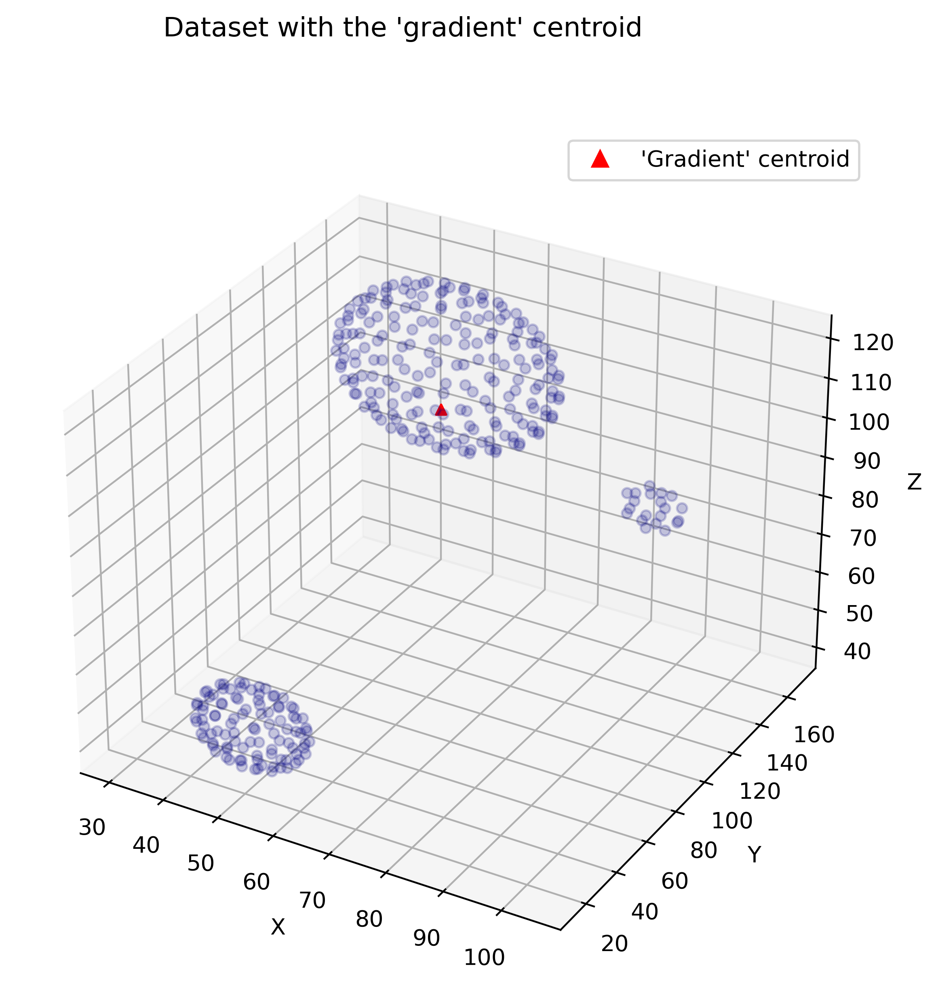

In [8]:
fig = plt.figure( figsize=(20,7), dpi = 400 )

ax = fig.add_subplot( 111, projection='3d' ); ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z');
legend = []

## Plotting all data
ax.scatter(df["x"], df["y"], df["z"], color = "navy", alpha = 0.2)

## Plotting the "gradient" centroid
ax.scatter(grad_cent_coord[0], grad_cent_coord[1], grad_cent_coord[2], color = "red", marker = "^")
legend.append( Line2D([0], [0], marker = "^", color = "red", label = "'Gradient' centroid", markersize = 7, ls = '') )

plt.legend(handles = legend, loc = 'best')
fig.suptitle("Dataset with the 'gradient' centroid")

plt.show()

# Using a random subsampling of the dataset

Another way of getting the centroïd is to get random subsample of the dataset and compute the centroïd out of these. In the end, we can select the median centroid.

## Computing a given number of sub-centroïd

In [10]:
batch_size = 10
iteration = 1000

rng_centroids = pd.DataFrame(columns = ["x", "y", "z"], dtype = "float")

start_time = time.time()
for iter in range(iteration):
    sample = df.sample(batch_size)
    
    rng_centroids.loc[iter] = [sample[axis].mean() for axis in list("xyz")]
    
rng_cent_coord = np.array(rng_centroids.mean())
print("Centroid coordinates : ", rng_cent_coord)
print(rng_centroids.head())
print("Computing time : ", round(time.time()-start_time, 3),"sec" )

Centroid coordinates :  [ 52.86952984 108.1504347   84.45770907]
           x           y          z
0  49.821724  101.988833  80.362433
1  50.773543  120.625324  79.450896
2  54.041918  119.435256  93.034781
3  48.108787   81.808969  75.089659
4  54.349011  108.577964  84.037078
Computing time :  1.147 sec


## Checking the results

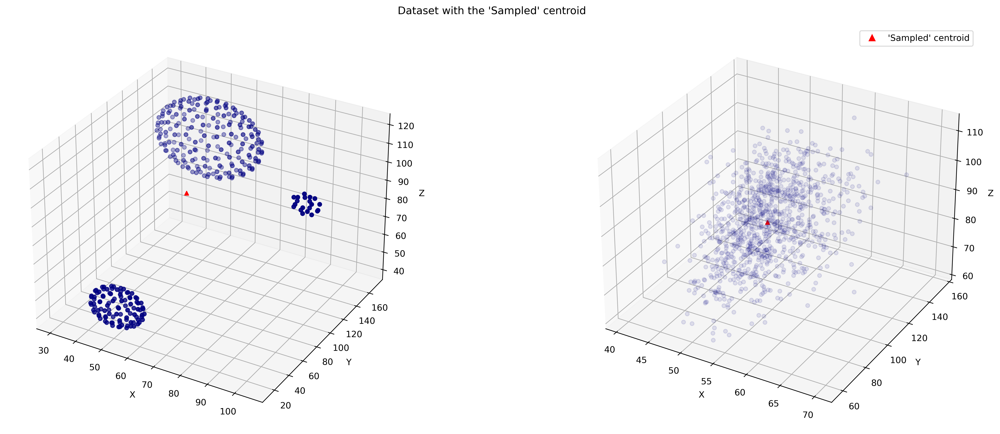

In [12]:
fig = plt.figure( figsize=(20,7), dpi = 400 )

ax1 = fig.add_subplot( 1, 2, 1, projection='3d' ); ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z');
ax2 = fig.add_subplot( 1, 2, 2, projection='3d' ); ax2.set_xlabel('X'); ax2.set_ylabel('Y'); ax2.set_zlabel('Z'); 
legend = []

## Plotting all data
ax1.scatter(df["x"], df["y"], df["z"], color = "navy")

## Plotting the "sampled" centroid
ax1.scatter(rng_cent_coord[0], rng_cent_coord[1], rng_cent_coord[2], color = "red", marker = "^")
legend.append( Line2D([0], [0], marker = "^", color = "red", label = "'Sampled' centroid", markersize = 7, ls = '') )

## Showing all computed centroids and the "sampled" centroid
ax2.scatter(rng_centroids["x"], rng_centroids["y"], rng_centroids["z"], color = "navy", alpha = 0.1)
ax2.scatter(rng_cent_coord[0], rng_cent_coord[1], rng_cent_coord[2], color = "red", marker = "^")


plt.legend(handles = legend, loc = 'best')
fig.suptitle("Dataset with the 'Sampled' centroid")

plt.tight_layout()

plt.show()

# Comparing results

In [ ]:
fig = plt.figure( figsize=(20,7), dpi = 200 )

ax1 = fig.add_subplot( 1, 3, 1, projection='3d' ); ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z');

legend = []

## Plotting all data
ax1.scatter(df["x"], df["y"], df["z"], color = "navy", alpha = 0.2)

## Plotting centroids
ax1.scatter(raw_cent_coord[0], raw_cent_coord[1], raw_cent_coord[2], color = "red", marker = "^")
ax1.scatter(grad_cent_coord[0], grad_cent_coord[1], grad_cent_coord[2], color = "green", marker = "^")
ax1.scatter(rng_cent_coord[0], rng_cent_coord[1], rng_cent_coord[2], color = "purple", marker = "^")

legend.append( Line2D([0], [0], marker = "^", color = "red", label = "'Raw' centroid", markersize = 7, ls = '') )
legend.append( Line2D([0], [0], marker = "^", color = "green", label = "'Gradient' centroid", markersize = 7, ls = '') )
legend.append( Line2D([0], [0], marker = "^", color = "purple", label = "'Sampled' centroid", markersize = 7, ls = '') )


plt.legend(handles = legend, loc = 'best')
ax1.set_title("Dataset with the various centroids")

plt.tight_layout()

plt.show()

From these results, we can say that the gradient method is better on this type of datasets where the clusters of cells are well separated. The gradient produce better results but is also way slower than the subsampling method. 

# 2 - Organoïd finding using clustering

## Importing required libraries

In [25]:
from sklearn.cluster import DBSCAN

## Clustering the dataset using DBSCAN
In order to do that, we simply transform the coordinates dataset into an array where rows are points and columns are the axis (X, Y, Z).

In [23]:
## Transforming data into an array.
coord_arr = np.array(df[list("xyz")].to_numpy())

print("First 5 rows of the array : ")
print(coord_arr[:5, :])
print("")
print("First 5 rows of the dataframe")
print(df.iloc[:5][list("xyz")])

First 5 rows of the array : 
[[ 50.         170.         100.        ]
 [ 47.9144322  169.79899497 101.91055095]
 [ 50.34881429 169.59798995  96.02544109]
 [ 52.96559966 169.39698492 103.8680996 ]
 [ 44.47205006 169.1959799   99.02218349]]

First 5 rows of the dataframe
           x           y           z
0  50.000000  170.000000  100.000000
1  47.914432  169.798995  101.910551
2  50.348814  169.597990   96.025441
3  52.965600  169.396985  103.868100
4  44.472050  169.195980   99.022183


In [146]:
## Running DBSCAN
clusters_res = DBSCAN(eps = 7, min_samples = 1).fit_predict(coord_arr)

print("Clusters : ", clusters_res)
## Index is the row index in the array

Clusters :  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


## Checking the results

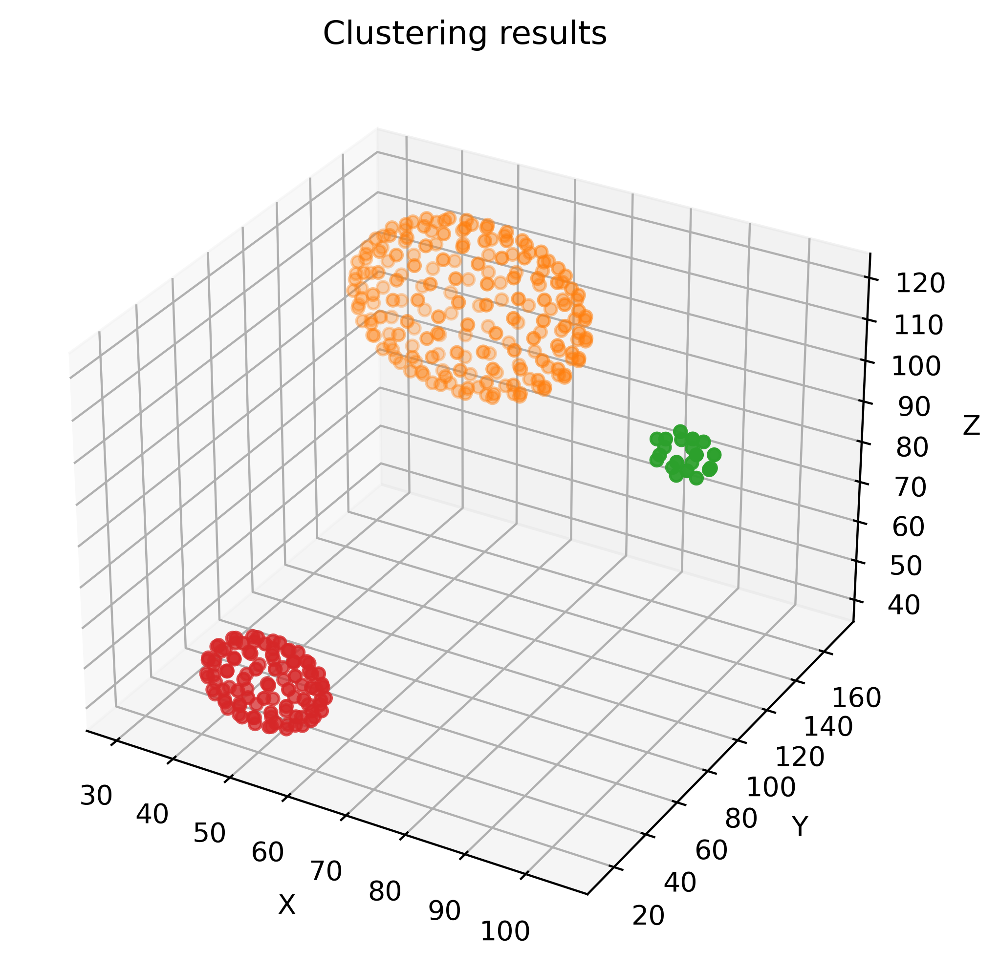

In [147]:
fig = plt.figure( figsize=(20,7), dpi = 400 )

ax1 = fig.add_subplot( 1, 3, 1, projection='3d' ); ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z');

legend = []

## Setting the cmap
cmap = plt.cm.get_cmap("tab10")
colors = pd.Series(clusters_res+1).map(cmap)

ax1.set_title("Clustering results")

ax1.scatter(coord_arr[:, 0], coord_arr[:, 1], coord_arr[:, 2], color = colors)

The results looks really great, so DBSCAN is able to distinguish between clusters that are well separated. But, does it still works with more closer clusters ?

## Testing on much closer clusters

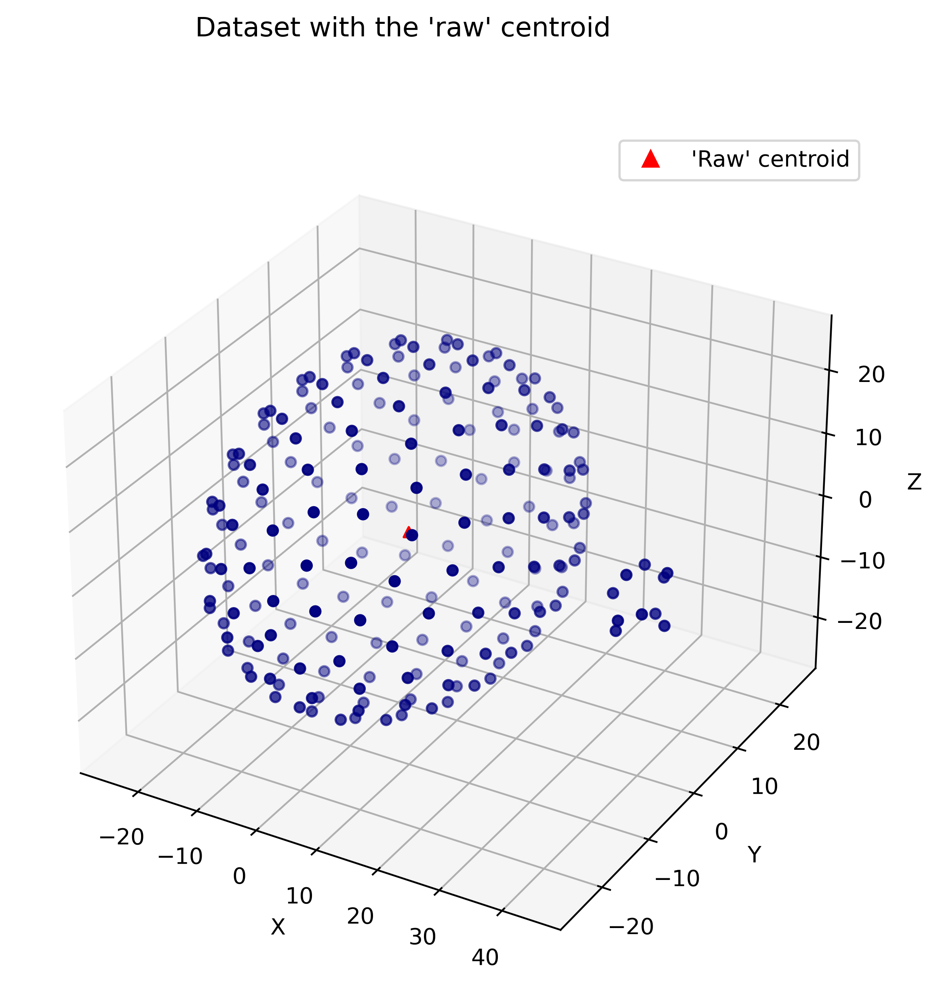

In [44]:
df2 = pd.read_csv(r"./data/close_clusters.csv")

fig = plt.figure( figsize=(20,7), dpi = 400 )

ax = fig.add_subplot( 111, projection='3d' ); ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z');

## Plotting all data
ax.scatter(df2["x"], df2["y"], df2["z"], color = "navy")

## Plotting the "raw" centroid
raw_cent2_coord = np.array(df2[list("xyz")].mean())

ax.scatter(raw_cent2_coord[0], raw_cent2_coord[1], raw_cent2_coord[2], color = "red", marker = "^")
legend = [Line2D([0], [0], marker = "^", color = "red", label = "'Raw' centroid", markersize = 7, ls = '')]

plt.legend(handles = legend, loc = 'best')
fig.suptitle("Dataset with the 'raw' centroid")

plt.show()


In [144]:
## Transforming data into an array.
coord2_arr = np.array(df2[list("xyz")].to_numpy())

## Running DBSCAN
clusters2_res = DBSCAN(eps = 7, min_samples = 1).fit_predict(coord2_arr)

print("Clusters : ", clusters2_res)
## Index is the row index in the array

Clusters :  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]


## Checking the results once again

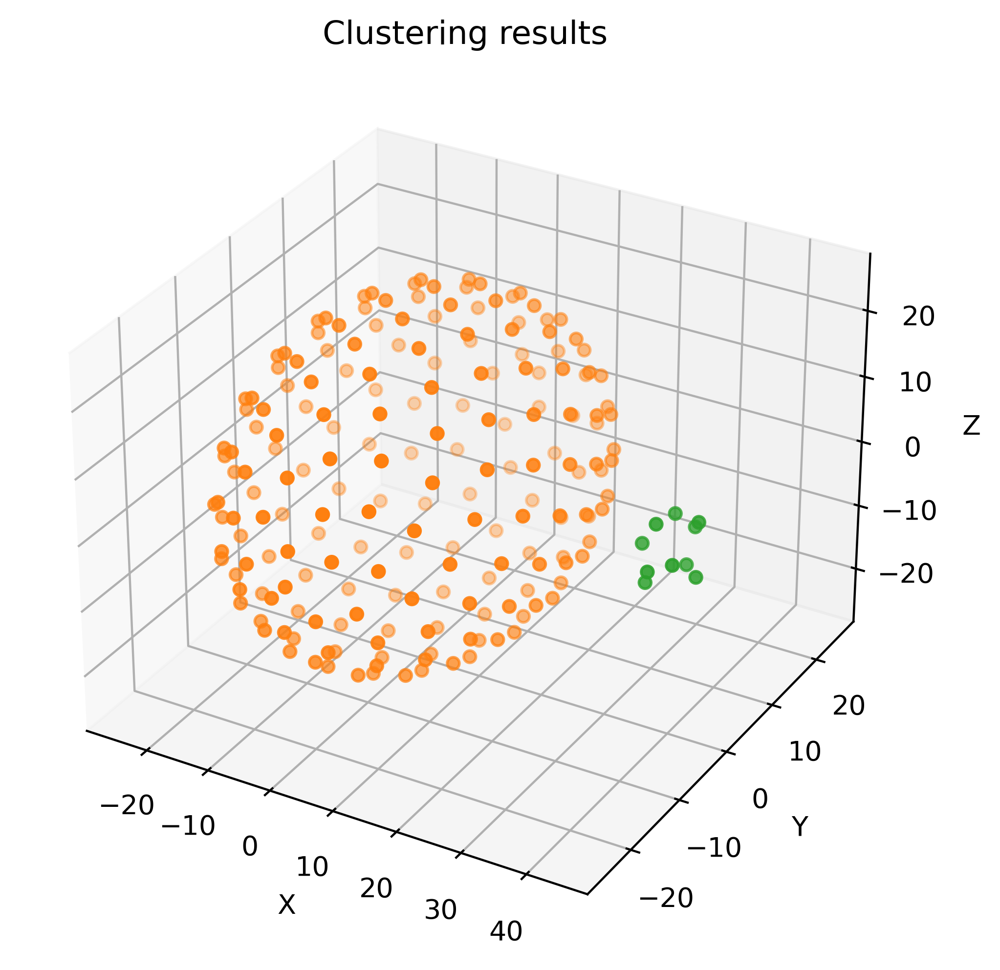

In [145]:
fig = plt.figure( figsize=(20,7), dpi = 400 )

ax1 = fig.add_subplot( 1, 3, 1, projection='3d' ); ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z');

legend = []

## Setting the cmap
cmap = plt.cm.get_cmap("tab10")
colors2 = pd.Series(clusters2_res+1).map(cmap)

ax1.set_title("Clustering results")

ax1.scatter(coord2_arr[:, 0], coord2_arr[:, 1], coord2_arr[:, 2], color = colors2)

We can see that the clustering isn't great in this case but it can be improved by modifying the eps and min_samples variables.
**eps** is the maximum range for 2 points to be condidered in the neighborhood of each others.
**min_samples** is the minimum neighbors a point must have to be considered a core point.

## Adjusting eps and min_samples: effect on the number of clusters for both datasets.

In [148]:
benchmark_df = pd.DataFrame(columns = ["eps", "min_samples", "n_clusters"], dtype = "int")
benchmark2_df = pd.DataFrame(columns = ["eps", "min_samples", "n_clusters"], dtype = "int")

ID = 0
for eps in range(1, 42, 2):
    for min_samples in range(1,11):
        results = DBSCAN(eps = eps, min_samples = min_samples).fit_predict(coord2_arr)
        benchmark2_df.loc[ID] = [eps, min_samples, len(pd.Series(results).unique())]
        
        results = DBSCAN(eps = eps, min_samples = min_samples).fit_predict(coord_arr)
        benchmark_df.loc[ID] = [eps, min_samples, len(pd.Series(results).unique())]
        
        ID += 1
        
print(benchmark_df)

     eps  min_samples  n_clusters
0      1            1         320
1      1            2           1
2      1            3           1
3      1            4           1
4      1            5           1
..   ...          ...         ...
205   41            6           3
206   41            7           3
207   41            8           3
208   41            9           3
209   41           10           3

[210 rows x 3 columns]


## Plotting results

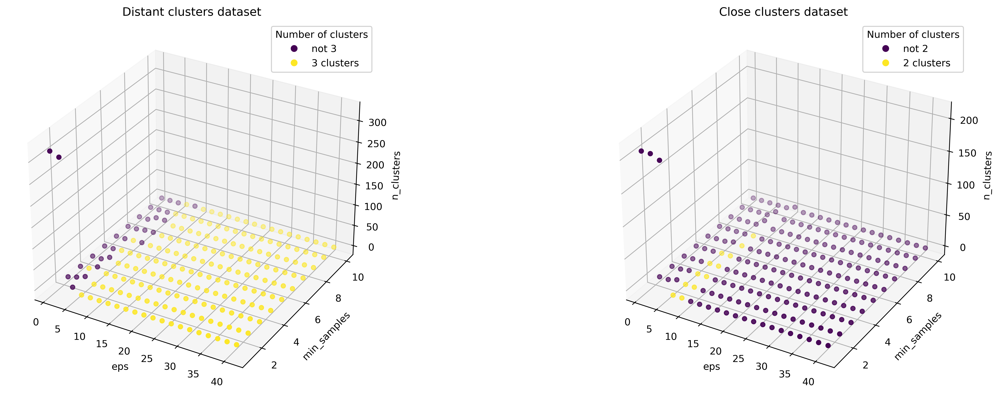

In [149]:
fig = plt.figure( figsize=(20,7), dpi = 400 )

ax1 = fig.add_subplot( 1, 2, 1, projection='3d' ); ax1.set_xlabel('eps'); ax1.set_ylabel('min_samples'); ax1.set_zlabel('n_clusters');
ax2 = fig.add_subplot( 1, 2, 2, projection='3d' ); ax2.set_xlabel('eps'); ax2.set_ylabel('min_samples'); ax2.set_zlabel('n_clusters');

ax1.set_title("Distant clusters dataset")
ax2.set_title("Close clusters dataset")


benchmark_df["good_param"] = [(n == 3) for n in benchmark_df["n_clusters"]]
benchmark_df["label"] = ["3 clusters"*(val)+"not 3"*(val == 0) for val in benchmark_df["good_param"]]
benchmark2_df["good_param"] = [(n == 2) for n in benchmark2_df["n_clusters"]]
benchmark2_df["label"] = ["2 clusters"*(val)+"not 2"*(val == 0) for val in benchmark2_df["good_param"]]

## Plotting scatterplots
scatter1 = ax1.scatter(benchmark_df["eps"], benchmark_df["min_samples"], benchmark_df["n_clusters"], 
                      c = benchmark_df["good_param"], label = benchmark_df["label"], cmap = "viridis")
scatter2 = ax2.scatter(benchmark2_df["eps"], benchmark2_df["min_samples"], benchmark2_df["n_clusters"], 
                      c = benchmark2_df["good_param"], label = benchmark2_df["label"], cmap = "viridis")

## Adding legends
legend1 = ax1.legend(scatter1.legend_elements()[0], ["not 3", "3 clusters"],
                     loc="best", title="Number of clusters")
legend2 = ax2.legend(scatter2.legend_elements()[0], ["not 2", "2 clusters"],
                     loc="best", title="Number of clusters")
ax1.add_artist(legend1)
ax2.add_artist(legend2)


plt.show()